# Exercises Unit 4: Visualisation
### Coding Fundamentals for PhD Students

__Exercise 1__

In this exercise, the goal is to replicate a famous plots from chaos theory. The nonlinear difference equation called [logistic map](https://en.wikipedia.org/wiki/Logistic_map) is very simple to write down, but displays some strikingly complex behaviour:

$$
x_{n+1} = rx_{n}(1-x_{n})
$$

Starting with an initial value of $x_{0}$ between one and zero, e.g. 0.5, and setting a constant value of r e.g. between zero and four, the equation is iterated forward. The first values of x are discarded, the rest is stored. We will only care about the visualisation here, but for some easy to watch introduction to the topic see e.g. [this](https://youtu.be/ovJcsL7vyrk) and [this]( https://youtu.be/ETrYE4MdoLQ) video.

The code below already creates the full underlying data and stores it in `df`. For each value of r there are n=1000 observations/rows of x values. Using `df`, try to replicate the following figure:

<center><img src="img/chaos.png" width="45%"/></center>



In [2]:
import pandas as pd
import numpy as np

# x observations for each r value
n = 1000
# Step between each r value
r_step = 0.001

r_grid = np.arange(2.5, 4, 0.001)
to_discard = (
    500  # numbers of iterations discarded before those stored for a respective r value
)

data = []
for r in r_grid:
    # Note: `np.empty` does not create an empty array, it just initialised one
    # with arbitrary values. Need to be sure it is indeed fully filled out
    logmapvalues = np.empty((n + to_discard,))
    logmapvalues[0] = 0.5

    for k in range(1, len(logmapvalues)):
        logmapvalues[k] = r * logmapvalues[k - 1] * (1 - logmapvalues[k - 1])

    logmapvalues = logmapvalues[500:]

    data.append(pd.DataFrame({"r": np.ones(len(logmapvalues)) * r, "x": logmapvalues}))

df = pd.concat(data)

<Axes: xlabel='r', ylabel='x'>

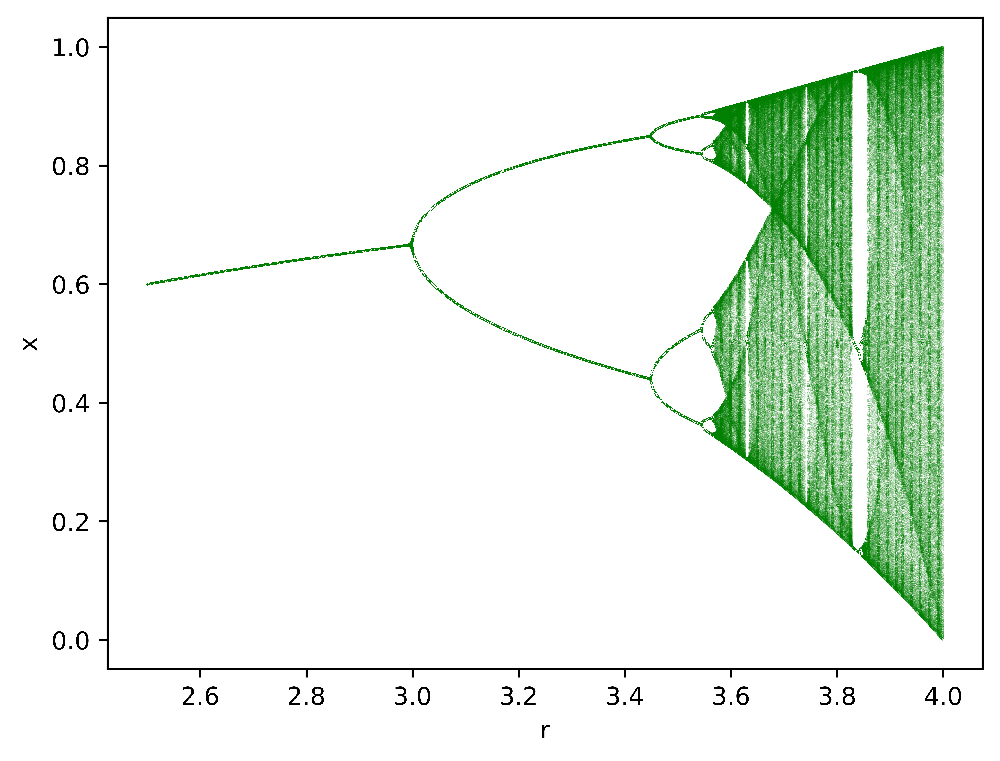

In [3]:
import matplotlib.pyplot as plt

fig = plt.figure(dpi=1000)
df.plot.scatter(x="r", y="x", s=0.0001, c="green", ax=plt.gca())

__Exercise 2__

Explore the visualation samples at https://plotly.com/python/, https://seaborn.pydata.org/examples/index.html, or https://www.python-graph-gallery.com/. Load data from your research into Python using pandas and adjust one or two of the code snippets to visualise these data. This could either replicate a plot that you had so far created with other software or create a new plot.

In [ ]:
# Your code here

__Exercise 3__

Exploring the documentation [here](https://docs.streamlit.io/), can you adjust the Streamlit app that we created in the lecture to contain one further feature such as e.g. the option to select different variables for the time series plot instead of the Gini index, or selecting only certain years, etc.?

<br>

__Exericse 4 (optional)__

Based on some data from your research and using the documentation, try to build a simple Streamlit dashboard to illustrate some summary statistic or visualisation depending on user input.